In [1]:
%cd C:\Users\kabousselham\Desktop\python\Manning_sales_forecast_deep_learning

C:\Users\kabousselham\Desktop\python\Manning_sales_forecast_deep_learning


In [2]:
import numpy as np
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pio.templates.default = "plotly_white"
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
from pathlib import Path
from itertools import product
from scipy.signal import detrend, periodogram
from tqdm.autonotebook import tqdm
np.random.seed()
tqdm.pandas()
import matplotlib
matplotlib.use('nbAgg')

C:\Users\kabousselham\AppData\Local\Temp\ipykernel_13456\4169064705.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
data_path=Path("data")

In [4]:
df=pd.read_csv(data_path/'sales_processed.csv')

In [5]:
df.head()

,date,store_id,cat_id,sales
0,2011-01-29,TX_1,FOODS,3950.35
1,2011-01-30,TX_1,FOODS,3844.97
2,2011-01-31,TX_1,FOODS,2888.03
3,2011-02-01,TX_1,FOODS,3631.28
4,2011-02-02,TX_1,FOODS,3072.18


# Answer to question 1

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58230 entries, 0 to 58229
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   date      58230 non-null  object 
 1   store_id  58230 non-null  object 
 2   cat_id    58230 non-null  object 
 3   sales     58230 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.8+ MB


In [7]:
df['date']=pd.to_datetime(df['date'])

# Answers to question 2

In [8]:
# Just a plot formatting function
def format_plot(fig, legends = None, xlabel="Time", ylabel="Value", font_size=15, title_font_size=20):
    if legends:
        names = cycle(legends)
        fig.for_each_trace(lambda t:  t.update(name = next(names)))
    fig.update_layout(
            autosize=True,
            width=900,
            height=500,
            title={
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
            titlefont={
                "size": 15
            },
            legend_title = None,
            legend=dict(
                font=dict(size=font_size),
                orientation="h",
                yanchor="bottom",
                y=0.98,
                xanchor="right",
                x=1,
            ),
            yaxis=dict(
                title_text=ylabel,
                titlefont=dict(size=font_size),
                tickfont=dict(size=font_size),
            ),
            xaxis=dict(
                title_text=xlabel,
                titlefont=dict(size=font_size),
                tickfont=dict(size=font_size),
            )
        )
    return fig

In [9]:
def show_sales(df,category):
    """
    Plot interactive line charts of sales
    """
    font_size=20
    category_mask=(df['cat_id']==category)
    fig = go.Figure()
    # Iterate over unique store IDs and add traces for each store
    for store_id in df['store_id'].unique():
        store_mask = (df['store_id'] == store_id) & category_mask
        fig.add_trace(go.Scatter(
            x=df.loc[store_mask, 'date'],
            y=df.loc[store_mask, 'sales'],
            mode="lines",
            name=f"Store {store_id}"
        ))
    fig.update_layout(title_text=f"Sales for {category} category")
    
    return fig

In [10]:
#plot for FOODS category
fig=show_sales(df,'FOODS')
fig = format_plot(fig, ylabel="Sales", xlabel="Date", legends=df['store_id'].unique().tolist())
fig.show()

In [11]:
df['cat_id'].unique()

array(['FOODS', 'HOBBIES', 'HOUSEHOLD'], dtype=object)

In [12]:
#plot for HOBBIES category
fig=show_sales(df,'HOBBIES')
fig = format_plot(fig, ylabel="Sales", xlabel="Date", legends=df['store_id'].unique().tolist())
fig.show()

In [13]:
#plot for HOUSEHOLD category
fig=show_sales(df,'HOUSEHOLD')
fig = format_plot(fig, ylabel="Sales", xlabel="Date", legends=df['store_id'].unique().tolist())
fig.show()

According to the three previous figures, we can infer the following observations:<br>
 - For the 'FOODS' category plots: we can observe general trends in most of the plots (This should be confirmed later). However, abrupt breaks can be noticed in the plots of WI_2, WI_1 and CA_2 stores. These breaks should bias the modeling and we can hopefully resolve them by removing the timesteps before but not for the case of CA_2 store because we would lose most of data as the break is located near the end of the recorded values. 
 - For the 'HOBBIES' category plots: Such abrupt breaks are inexistant. All the stores share approximately the same dates for peaks and troughs. This indicates we will probably have a shared seasonlity. 
 - For the 'HOUSEHOLD' category plots: Such abrupt breaks observed for foods are inexistant. Again, all the stores share approximately the same dates for peaks and troughs.

In general, plots are bit chaotic which is not helpful to spot seasonality wtih the naked eye. CA_3 is the store which records the biggest sales figures among other stores. And this is valid for each of the three categories.

# Answers to question 3

In [14]:
# drop the data points identified as past data before trend breaks
# dates have been chosen from the previous plots
WI_1_FOODS_date_mask=((df['date']>'2012-10-25') & (df['store_id']=='WI_1') & (df['cat_id']=='FOODS'))
WI_1_FOODS_mask=(df['store_id']=='WI_1') & (df['cat_id']=='FOODS')
filtered_df_WI_1_FOODS=pd.concat([df[~WI_1_FOODS_mask],df[WI_1_FOODS_date_mask]],join='inner')

In [15]:
# filtering for FOODS category and WI_2 store in the next step
WI_2_FOODS_date_mask=(filtered_df_WI_1_FOODS['date']>'2012-05-29') & (filtered_df_WI_1_FOODS['store_id']=='WI_2') & (filtered_df_WI_1_FOODS['cat_id']=='FOODS')
WI_2_FOODS_mask=(filtered_df_WI_1_FOODS['store_id']=='WI_2') & (filtered_df_WI_1_FOODS['cat_id']=='FOODS')
filtered_df=pd.concat([filtered_df_WI_1_FOODS[~WI_2_FOODS_mask],filtered_df_WI_1_FOODS[WI_2_FOODS_date_mask]],join='inner')

In [16]:
#plot for FOODS category to check
fig=show_sales(filtered_df,'FOODS')
fig = format_plot(fig, ylabel="Sales", xlabel="Date", legends=df['store_id'].unique().tolist())
fig.show()

In [17]:
# save output to sales_cleaned.csv
filtered_df.to_csv(data_path/'sales_cleaned.csv',index=False)

# Answers to question 4

In [18]:
def box_line_plots(df,store,category):
    """
    Function which returns boxplots and line plots as shown in the instructions
    df: dataframe
    store: store id 
    category: category id
    """
    mask=(df['store_id']==store) & (df['cat_id']==category)
    sub_df=df[mask].copy()
    sub_df['weekday']=sub_df['date'].dt.weekday
    sub_df['dayofmonth']=sub_df['date'].dt.day
    sub_df['month']=sub_df['date'].dt.month
    fig,axes=plt.subplots(nrows=3, ncols=2, figsize=(20, 15))
    sns.boxplot(x='weekday', y='sales', data=sub_df, ax=axes[0,0])
    sns.lineplot(x='weekday', y='sales', data=sub_df, ax=axes[0,1])
    sns.boxplot(x='dayofmonth', y='sales', data=sub_df, ax=axes[1,0])
    sns.lineplot(x='dayofmonth', y='sales', data=sub_df, ax=axes[1,1])
    sns.boxplot(x='month', y='sales', data=sub_df, ax=axes[2,0])
    sns.lineplot(x='month', y='sales', data=sub_df, ax=axes[2,1])
    
    return fig

<IPython.core.display.Javascript object>


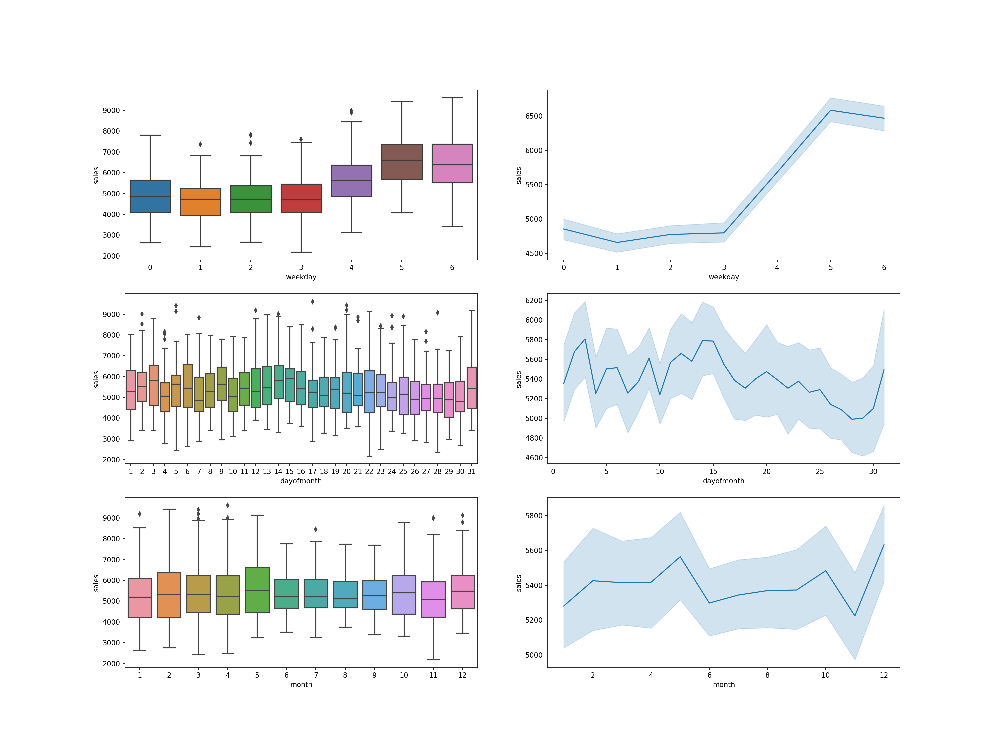

In [19]:
fig=box_line_plots(filtered_df,'WI_1','FOODS')
fig.show();

From the plots we can spot the following facts:
- weekday patterns. In fact, sales tend to be higher on fridays and weekends
- Mid, first days and last days of each month show generally the highest sales 
- From the month boxplots, there is no evidence of yearly seasonality

# Answers to question 5

In [20]:
def detrend_series(store, category):
    """
    Detrend the sales of a time series and return the detrended sales value, 
    the trend identified, and the original sales 
    """
    mask=(filtered_df['store_id']==store) & (filtered_df['cat_id']==category)
    detrended_df=filtered_df[mask].copy()
    detrended_df['detrended']=detrend(detrended_df['sales'])
    detrended_df['trend']=detrended_df['sales']-detrended_df['detrended']
    detrended_df['store_cat_id']=f"{store}_{category}"
    result=detrended_df[['date','store_cat_id','detrended','trend','sales']]

    return result

In [21]:
detrend_series('WI_1', 'FOODS').head()

,date,store_cat_id,detrended,trend,sales
41397,2012-10-26,WI_1_FOODS,1709.330018,3973.169982,5682.50
41398,2012-10-27,WI_1_FOODS,1527.043077,3975.366923,5502.41
41399,2012-10-28,WI_1_FOODS,1344.756135,3977.563865,5322.32
41400,2012-10-29,WI_1_FOODS,-227.300806,3979.760806,3752.46
41401,2012-10-30,WI_1_FOODS,-629.217747,3981.957747,3352.74


In [43]:
def summarise_periodicity(data_detrended):
    """
    Extract important frequency values with periodogram
    data_detrended: the column 'detrended' of the detrended dataframe extracted 
    """
    f, Periodogram = periodogram(data_detrended['detrended'])
    data = {'interval':1/f, 'power_spectral_density':Periodogram}
    df_periodogram = pd.DataFrame(data = data)
    df_periodogram.sort_values(by=['power_spectral_density'], ascending=False, inplace=True)

    return df_periodogram

In [44]:
summarise_periodicity(detrend_series('WI_1', 'FOODS')).head(20)

C:\Users\kabousselham\AppData\Local\Temp\ipykernel_13456\47964505.py:7: RuntimeWarning:

divide by zero encountered in divide



,interval,power_spectral_density
186,7.016129,3.860239e+08
187,6.978610,1.929132e+08
373,3.498660,8.672372e+07
188,6.941489,2.920409e+07
185,7.054054,2.865000e+07
2,652.500000,2.574052e+07
43,30.348837,1.821569e+07
189,6.904762,1.572429e+07
184,7.092391,1.492018e+07
129,10.116279,1.473172e+07


In [39]:
def plot_periodicity(data_detrended):
    """
    Plot periodogram
    """
    f, Pxx_den = periodogram(data_detrended.loc[:,'detrended'])
    plt.semilogy( f,Pxx_den)
    plt.title("Periodogram")
    plt.xlabel('frequency [Hz]')
    plt.ylabel('PSD [V**2/Hz]')
    plt.show()

<IPython.core.display.Javascript object>


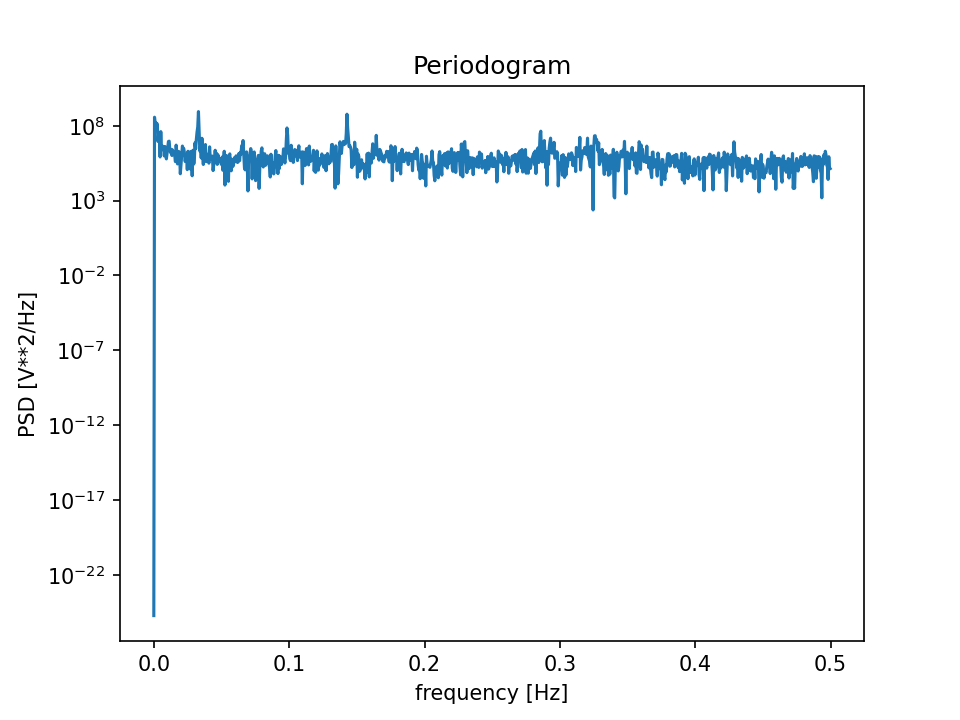

In [40]:
data_dterended=detrend_series('WI_3', 'FOODS')
plot_periodicity(data_dterended)

We can see that there are generally two dominant frequencies through variations of plots, namely the weekly and monthly seasonalities. More importantly, the weekly seasonality always shows the biggest spectral power density.

The deduced analysis from the periodogram matches the analysis done with the boxplots and line plots from the previous question, which gives it more credibility.

# Answers to question 6

In [45]:
def get_cv_split(df, split_num, prediction_length=28, validation=True):
    """
    Implement train-test split given a cv split number and return training, val and test data
    df: the dataframe containing the time series
    split_num: the number of splits
    prediction_length: the length of each of the validation sets and test sets
    validation: boolean value to indicate whether validation set should exist in case of hypeparameter
                tuning
    """
    stores=df['store_id'].unique()
    categories=df['cat_id'].unique()
    max_date=df['date'].max()
    test_lower_bound=max_date-pd.Timedelta(f"{prediction_length*(2*(split_num+1)-1)} days")
    test_upper_bound=max_date-pd.Timedelta(f"{prediction_length*2*split_num} days")
    val_lower_bound=max_date-pd.Timedelta(f"{prediction_length*2*(split_num+1)} days")
    test_df=df[(df['date']>test_lower_bound) & (df['date']<=test_upper_bound)]
    if validation:
        validation_df=df[(df['date']>val_lower_bound) & (df['date']<=test_lower_bound)]
        training_df=df[(df['date']<=val_lower_bound)]
    else:
        validation_df=pd.DataFrame()
        training_df=df[(df['date']<=test_lower_bound)]
             
    
    return training_df, validation_df, test_df

In [46]:
# check train-test split function
training_df, validation_df, test_df=get_cv_split(df, split_num=5, prediction_length=28, validation=True)

In [48]:
training_df[(training_df['store_id']=='TX_1') & (training_df['cat_id']=='FOODS')]

,date,store_id,cat_id,sales
0,2011-01-29,TX_1,FOODS,3950.35
1,2011-01-30,TX_1,FOODS,3844.97
2,2011-01-31,TX_1,FOODS,2888.03
3,2011-02-01,TX_1,FOODS,3631.28
4,2011-02-02,TX_1,FOODS,3072.18
...,...,...,...,...
1600,2015-06-17,TX_1,FOODS,3577.61
1601,2015-06-18,TX_1,FOODS,4135.27
1602,2015-06-19,TX_1,FOODS,4463.78
1603,2015-06-20,TX_1,FOODS,5437.10


In [49]:
test_df[(test_df['store_id']=='TX_1') & (test_df['cat_id']=='FOODS')]

,date,store_id,cat_id,sales
1633,2015-07-20,TX_1,FOODS,5416.86
1634,2015-07-21,TX_1,FOODS,4437.98
1635,2015-07-22,TX_1,FOODS,4670.84
1636,2015-07-23,TX_1,FOODS,4516.63
1637,2015-07-24,TX_1,FOODS,4833.90
1638,2015-07-25,TX_1,FOODS,5300.20
1639,2015-07-26,TX_1,FOODS,6327.38
1640,2015-07-27,TX_1,FOODS,4809.75
1641,2015-07-28,TX_1,FOODS,4065.70
1642,2015-07-29,TX_1,FOODS,4120.26


In [50]:
validation_df[(validation_df['store_id']=='TX_1') & (validation_df['cat_id']=='FOODS')]

,date,store_id,cat_id,sales
1605,2015-06-22,TX_1,FOODS,4297.43
1606,2015-06-23,TX_1,FOODS,3937.45
1607,2015-06-24,TX_1,FOODS,4107.09
1608,2015-06-25,TX_1,FOODS,4067.53
1609,2015-06-26,TX_1,FOODS,4506.76
1610,2015-06-27,TX_1,FOODS,4636.45
1611,2015-06-28,TX_1,FOODS,5026.32
1612,2015-06-29,TX_1,FOODS,4211.48
1613,2015-06-30,TX_1,FOODS,3744.16
1614,2015-07-01,TX_1,FOODS,4990.75


We can notice from the examples below that the split done yields three consecutive datasets without gaps or orverlapping.  

We estimate that the 2nd notebook is ready and that we can begin the next step.